#### Exploración extra: Reducir desvíos a Montevideo modificando la velocidad mínima permitida. 

**1.**
Eliminar límites de velocidad mínima (vmin = 0). Cuando un avión este a una distancia temporal menor a 4 min del avion de adelante disminuirá su velocidad hasta estar a más de 4 min de el avión de adelante, o alcanzar una velocidad de 0k. En caso de mucha congestíon, los aviones que lleguen a 0k retrocederán, buscarán un gap de 10 min y si no lo encuentran se desviarán a montevideo. 
Hipótesis: el atraso promedio aumentará, pero los desvíos a montevideo se minimizan --> trade off. 
El lamda elegido tendrá mucha incidencia en el éxito de esta propuesta. Con un lamda muy alto, aparecerán muchos aviones en la simulación y al ir disminuyendo la velocidad para mantener la distancia temporal minima permitida entre aviones se atrasarán también todos los que están detrás. Muchos aviones alcanzarán los 0k y se desviarán a Montevideo. 

**2.** 
Reducir los límites de velocidad mínima a la mitad. 
Hipótesis: más aviones se desviarán a Montevideo que en la propuesta 1, pero menos que en la simulacion original. El tiempo promedio de atraso aumentará en comparación a el escenario original, pero no tanto como en la propuesta 1. 


/var/folders/0y/tsllkfts05ngtc3fr0xjb6tm0000gn/T/ipykernel_46564/1819911926.py:228: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20", len(ids))


===== 📊 Resumen de la simulación con lam= 0.017 =====
✈️ Total de aviones: 16
✅ Aterrizados: 16
❌ Desviados: 0
🕐 Activos al final: 0
Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: 2.200000000000003
 Atraso promedio: 0.13750000000000018
===== 📊 Resumen de la simulación con lam= 0.2 =====
✈️ Total de aviones: 230
✅ Aterrizados: 219
❌ Desviados: 9
🕐 Activos al final: 2
Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: 741.8000000000023
 Atraso promedio: 3.3872146118721567
===== 📊 Resumen de la simulación con lam= 0.5 =====
✈️ Total de aviones: 542
✅ Aterrizados: 362
❌ Desviados: 168
🕐 Activos al final: 12
Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: 2745.5999999999817
 Atraso promedio: 7.584530386740281
===== 📊 Resumen de la simulación con lam= 0.8 =====
✈️ Total de aviones: 869
✅ Aterrizados: 477
❌ Desviados: 366
🕐 Activos al final: 26
Suma de minutos de atraso de todos los aviones aterrizados en la 

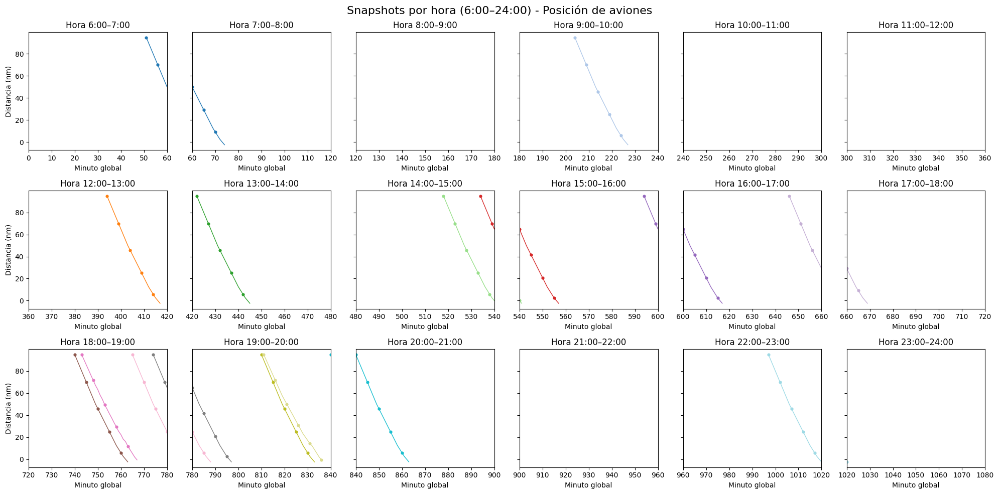

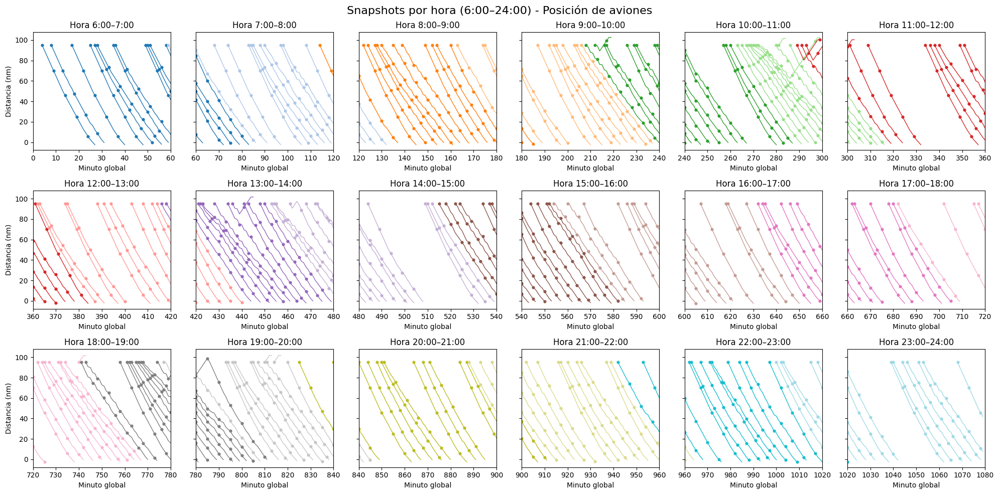

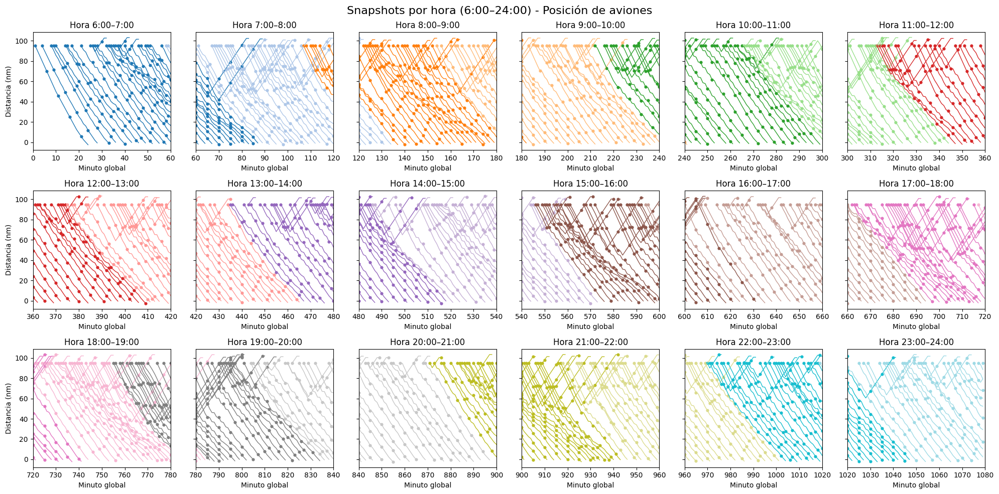

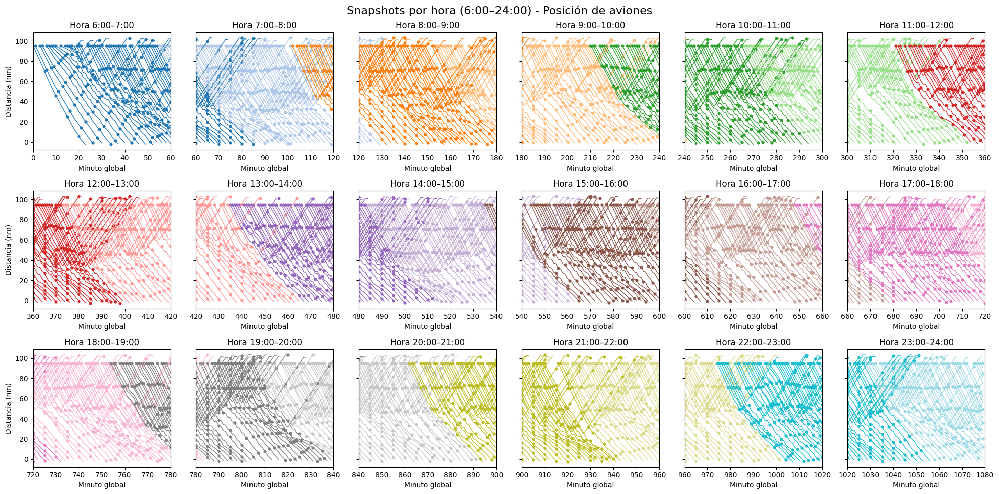

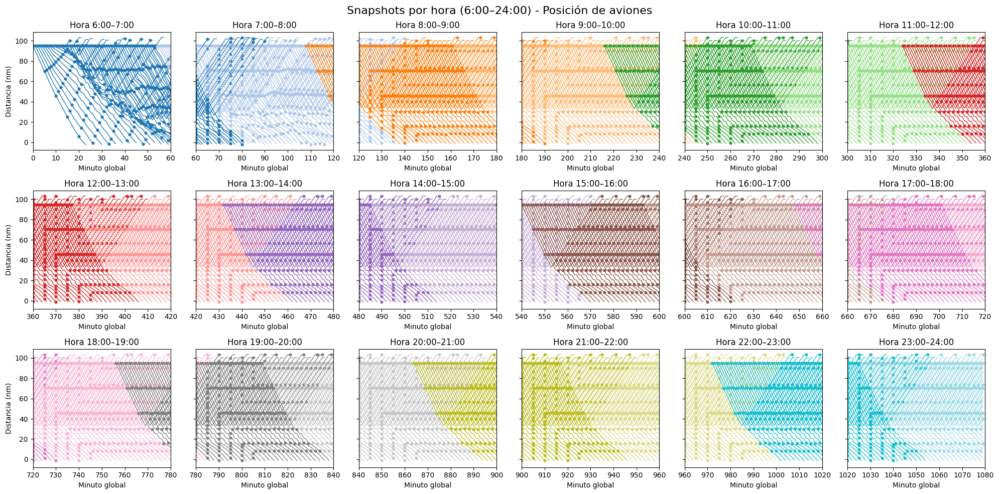

In [ ]:
## POPUESTA 1: ELIMINAR LIMITES DE VELOCIDAD MÍNIMA. 

import numpy as np
from typing import List
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from main import Simulador, RADAR_DIST, MIN_SEPARACION

# ======================
# Parámetros globales
# ======================
RADAR_DIST = 100
MIN_SEPARACION = 4
VEL_RETROCESO = 200.0

# ======================
# Funciones auxiliares
# ======================
def vel_maxima_permitida_por_tramo(dist_nm: float) -> int:
    """Velocidad máxima permitida según distancia a AEP."""
    if dist_nm > 50:
        return 300
    elif dist_nm > 15:
        return 250
    elif dist_nm > 5:
        return 200
    else:
        return 150


def velocidad_minima_permitida_por_tramo(distancia):
    #Velocidad mínima permitida según distancia a AEP.
    return 0
#Eliminamos limites de velocidad mínima


def tiempo_entre_aviones(avion_trasero, avion_delantero):
    """Devuelve la separación temporal (min) entre dos aviones."""
    delta_dist = avion_trasero.distancia - avion_delantero.distancia
    if avion_trasero.velocidad <= 0:
        return float("inf")
    return (delta_dist / avion_trasero.velocidad) * 60


def aterrizaje_libre(dist_inicial, minutos) -> float:
    """Distancia que se cubriría a velocidad máxima en un lapso dado."""
    v_max = vel_maxima_permitida_por_tramo(dist_inicial)
    return (v_max / 60.0) * minutos


def hay_gap_disponible(avion, cola) -> bool:
    """Verifica si el avión puede volver con al menos 10 minutos de separación."""
    pos = avion.distancia
    avance_estimado = aterrizaje_libre(pos, minutos=5)

    for otro in cola:
        if otro.estado in ("APROXIMANDO", "AJUSTANDO"):
            if pos - avance_estimado <= otro.distancia <= pos + avance_estimado:
                return False
    return True


# ======================
# Clase Avión . 
# ======================
class Avion:
    def __init__(self, id_avion, minuto_actual):
        self.id = id_avion
        self.distancia = 100.0
        self.velocidad = 0.0
        self.estado = "APROXIMANDO"
        # Estados posibles: APROXIMANDO | AJUSTANDO | REGRESANDO | REGRESANDO_VIENTO | DESVIADO | ATERRIZADO
        self.tiempo_llegada = minuto_actual
        self.retraso = 0
        self.t_aterrizaje = None

    def __repr__(self):
        return (f" Avión {self.id}\n"
                f" - Distancia: {self.distancia:.1f} mn\n"
                f" - Velocidad: {self.velocidad:.0f} kts\n"
                f" - Estado: {self.estado}")

    def controlar_aproximacion(self, lider=None):
        if lider is None:
            self.estado = "APROXIMANDO"
            self.velocidad = vel_maxima_permitida_por_tramo(self.distancia)
            return

        separacion = tiempo_entre_aviones(self, lider)
        if separacion < MIN_SEPARACION:
            nueva_vel = lider.velocidad - 20
            if nueva_vel < velocidad_minima_permitida_por_tramo(self.distancia):
                self.estado = "REGRESANDO" #solo van a regresar si llegan a un punto en el que disminuyen tanto la velocidad que llegan a 0 (o menos)
                self.velocidad = VEL_RETROCESO
    
            else:
                self.estado = "AJUSTANDO" 
                self.velocidad = nueva_vel
        else:
            self.estado = "APROXIMANDO"
            self.velocidad = vel_maxima_permitida_por_tramo(self.distancia)


# ======================
# Clase Simulador
# ======================
class Simulador:
    def __init__(self, seed=42):
        self.rng = np.random.default_rng(seed)
        self.aviones: dict[int, Avion] = {}
        self.historial = []
        self.finalizados: List[Avion] = []

    def generar_nuevo_avion(self, minuto: int, next_id: int, lam: float) -> int:
        if self.rng.random() < lam:
            avion = Avion(next_id, minuto)
            self.aviones[next_id] = avion
            return next_id + 1
        return next_id

    def actualizar_estados(self, minuto: int):
        activos = [a for a in self.aviones.values() if a.estado not in ("ATERRIZADO", "DESVIADO")]
        activos.sort(key=lambda av: av.distancia)

        for i, avion in enumerate(activos):
            if avion.estado == "REGRESANDO":
                self.controlar_regreso(avion, activos)
            else:
                lider = activos[i-1] if i > 0 and activos[i-1].estado != "REGRESANDO" else None
                avion.controlar_aproximacion(lider)

    def controlar_regreso(self, avion, cola):
        if avion.distancia > RADAR_DIST:
            avion.estado = "DESVIADO"
        elif hay_gap_disponible(avion, cola):
            avion.estado = "APROXIMANDO"

    def mover_aviones(self):
        for avion in self.aviones.values():
            if avion.estado in ("ATERRIZADO", "DESVIADO"):
                continue
            delta = avion.velocidad / 60.0
            if avion.estado == "REGRESANDO":
                avion.distancia += delta
            else:
                avion.distancia -= delta

    def gestionar_finalizados(self, minuto: int, tiempo_ideal=23.4):
        for avion in self.aviones.values():
            if avion.estado in ("ATERRIZADO", "DESVIADO"):
                continue
            if avion.distancia <= 0:
                avion.estado = "ATERRIZADO"
                avion.t_aterrizaje = minuto
                tiempo_real = minuto - avion.tiempo_llegada
                avion.retraso = max(0, tiempo_real - tiempo_ideal)
                self.finalizados.append(avion)

    def guardar_estado(self, minuto: int):
        for avion in self.aviones.values():
            self.historial.append({
                "minuto": minuto,
                "id": avion.id,
                "distancia": avion.distancia,
                "velocidad": avion.velocidad,
                "estado": avion.estado,
            })

    def simular_dia(self, lam: float, minutos=18*60):
        next_id = 1
        for minuto in range(minutos):
            next_id = self.generar_nuevo_avion(minuto, next_id, lam)
            self.actualizar_estados(minuto)
            self.mover_aviones()
            self.gestionar_finalizados(minuto)
            self.guardar_estado(minuto)



# igual al ej1 para poder comparar
# =========================
# Simulación de un día
# =========================
def correr_un_dia(lam=1/60, seed=42):
    sim = Simulador(seed=seed)
    sim.simular_dia(lam)
    return sim


# =========================
# Monte Carlo de arribos
# =========================
from scipy.stats import binom

def monte_carlo_arribos_binomial(lam=1/60, horas=18, repeticiones=1000):
    rng = np.random.default_rng(42)
    minutos = horas * 60
    p = lam
    mu = minutos * p

    simulados = rng.binomial(minutos, p, size=repeticiones)

    plt.hist(simulados, bins=range(simulados.min(), simulados.max()+2),
             density=True, alpha=0.6, color="skyblue", edgecolor="black",
             label="Simulación")

    x = np.arange(simulados.min(), simulados.max()+1)
    plt.plot(x, binom.pmf(x, minutos, p), "g--", lw=2, label="Binomial exacta")

    plt.axvline(simulados.mean(), color="blue", linestyle="--",
                label=f"Media simulada = {simulados.mean():.2f}")
    plt.axvline(mu, color="red", linestyle=":",
                label=f"Media teórica = {mu:.2f}")

    plt.title("Distribución de arribos en 1000 simulaciones (λ=1/60)")
    plt.xlabel("Número de aviones en 18h")
    plt.ylabel("Frecuencia relativa")
    plt.legend()
    plt.show()


# =========================
# Snapshots por hora
# =========================
def graficar_snapshots(sim, lamda, duracion_horas=18):
    historial = sim.historial
    ids = set(reg["id"] for reg in historial)
    cmap = cm.get_cmap("tab20", len(ids))
    colores = {id_: cmap(i) for i, id_ in enumerate(ids)}

    fig, axes = plt.subplots(3, 6, figsize=(20, 10), sharey=True)
    axes = axes.flatten()

    for h in range(duracion_horas):
        minuto_ini = h * 60
        minuto_fin = (h + 1) * 60
        ax = axes[h]

        for id_ in ids:
            # historial completo del avión
            registros = [r for r in historial if r["id"] == id_]
            if not registros:
                continue

            # cortar el historial en el primer aterrizaje/desvío
            corte_idx = None
            for i, r in enumerate(registros):
                if r["estado"] in ("ATERRIZADO", "DESVIADO"):
                    corte_idx = i
                    break
            if corte_idx is not None:
                registros = registros[:corte_idx+1]

            # ahora filtro solo la hora correspondiente
            registros = [r for r in registros if minuto_ini <= r["minuto"] <= minuto_fin]
            if registros:
                ts = [r["minuto"] for r in registros]
                ds = [r["distancia"] for r in registros]
                color = colores[id_]
                ax.plot(ts, ds, color=color, linewidth=1)
                ax.scatter(ts[::5], ds[::5], c=[color], s=12)

        ax.invert_yaxis()
        ax.set_xlim(minuto_ini, minuto_fin)
        ax.set_title(f"Hora {6+h}:00–{7+h}:00")
        ax.set_xlabel("Minuto global")
        if h % 6 == 0:
            ax.set_ylabel("Distancia (nm)")

    plt.suptitle("Snapshots por hora (6:00–24:00) - Posición de aviones", fontsize=16)
    plt.tight_layout()
    #plt.show()

    # ======================
    # Summary de estados finales
    # ======================
    estados_finales = {"ATERRIZADO": 0, "DESVIADO": 0, "ACTIVO": 0}
    atraso = 0
    for avion in sim.aviones.values():
        if avion.estado == "ATERRIZADO":
            estados_finales["ATERRIZADO"] += 1
            atraso += avion.retraso
        elif avion.estado == "DESVIADO":
            estados_finales["DESVIADO"] += 1
        else:
            estados_finales["ACTIVO"] += 1

    
    atraso_promedio = atraso / estados_finales['ATERRIZADO']
        

    print(f"===== 📊 Resumen de la simulación con lam= {lamda} =====")
    print(f"✈️ Total de aviones: {len(sim.aviones)}")
    print(f"✅ Aterrizados: {estados_finales['ATERRIZADO']}")
    print(f"❌ Desviados: {estados_finales['DESVIADO']}")
    print(f"🕐 Activos al final: {estados_finales['ACTIVO']}")
    print(f"Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: {atraso}")
    print(f" Atraso promedio: {atraso_promedio}")



# =========================
# Main
# =========================
if __name__ == "__main__":
    """
    lam = 0.2

    # 1. Simulación base
    sim = correr_un_dia(lam)
    print(f"Total aviones generados: {len(sim.aviones)}")
    aterrizados = [a for a in sim.aviones.values() if a.estado == "ATERRIZADO"]
    print(f"Aterrizados: {len(aterrizados)}")

    # 2. Monte Carlo
    monte_carlo_arribos_binomial(lam, repeticiones=1000)

    # 3. Graficar snapshots
    graficar_snapshots(sim)
    """

    lamdas = [0.017, 0.2, 0.5, 0.8, 1]
    for lamda in lamdas:
        sim = correr_un_dia(lamda)
        graficar_snapshots(sim, lamda) #descomentar plt.show() en graficar_snapshots para ver snapshots en el output. 
        




**Resultados de haber eliminado los límites de velocidad mínima y comparación con simulacion original (ej1)**
 1. Reduccion de los desvíos a Montevideo. En todos los casos (distintos lamdas), el porcentaje de aviones que son detectados por el radar y luego se desvían a Montevideo se reduce al eliminar los límites de velocidad mínima. En promedio, se redujo un 45,06%: un cambio muy significativo. Esto demuestra que la propuesta puede ser muy efectiva para reducir los desvíos. 

 2. Sin embargo, esta decision provoca mucho aumento en los minutos de atraso de los aviones en la simuacion. Para (casi) todas las tasas de arribo (lamdas) el atraso promedio aumenta **muy** significativamente. 

 | λ              | Cambio en atraso promedio | Cambio en desvíos |
|----------------|---------------------------|-------------------|
| 1/60 = 0.017  | -69.6%                    | 0%                |
| 0.02          | +10.1%                    | -83.3%            |
| 0.5           | +872%                     | -55.1%            |
| 0.8           | +∞                        | -46.6%            |
| 1             | +∞                        | -40.3%            |

 [cuadro comparativo completo](https://docs.google.com/spreadsheets/d/1xJ9iZh-RHovqKXjzVQwHniUZ6GUaY2kzMOju7ekHTf8/edit?gid=0#gid=0)

Observamos un ***trade-off*** claro: se eliminan los desvíos, pero aumenta el tiempo de atraso promedio. 

Para entender más en profundidad esta característica de nuestra simulacion, introducimos una nueva propuesta: Bajar los límites de velocidad mínima a la mitad (si antes era 300k, lo reduciremos a 150k). Además, este enfoque es más realista que la primer propuesta, ya que un avión no puede volar a 0kts por razones físicas, operativas y de seguridad. 
Hipótesis: no se eliminan por completo los desvíos a Montevideo, pero si disminuyen. Aumentará el atraso promedio, pero no tanto como si eliminaríamos los limites de velocidad mínima por completo. 

/var/folders/0y/tsllkfts05ngtc3fr0xjb6tm0000gn/T/ipykernel_7637/1542920267.py:234: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20", len(ids))


===== 📊 Resumen de la simulación con lam= 0.017 =====
✈️ Total de aviones: 16
✅ Aterrizados: 16
❌ Desviados: 0
🕐 Activos al final: 0
Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: 2.200000000000003
 Atraso promedio: 0.13750000000000018
===== 📊 Resumen de la simulación con lam= 0.2 =====
✈️ Total de aviones: 230
✅ Aterrizados: 197
❌ Desviados: 30
🕐 Activos al final: 3
Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: 831.0000000000023
 Atraso promedio: 4.2182741116751385
===== 📊 Resumen de la simulación con lam= 0.5 =====
✈️ Total de aviones: 542
✅ Aterrizados: 288
❌ Desviados: 239
🕐 Activos al final: 15
Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: 621.0000000000032
 Atraso promedio: 2.156250000000011
===== 📊 Resumen de la simulación con lam= 0.8 =====
✈️ Total de aviones: 869
✅ Aterrizados: 379
❌ Desviados: 462
🕐 Activos al final: 28
Suma de minutos de atraso de todos los aviones aterrizados en la 

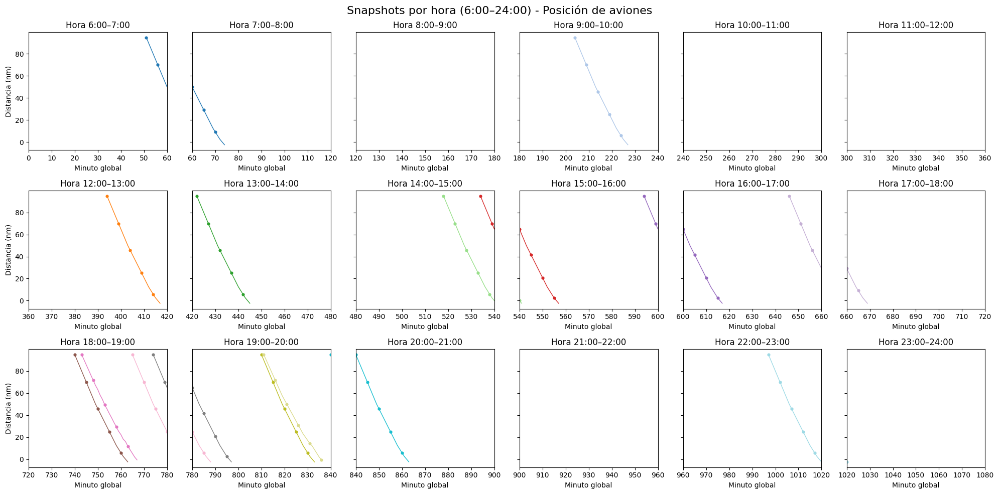

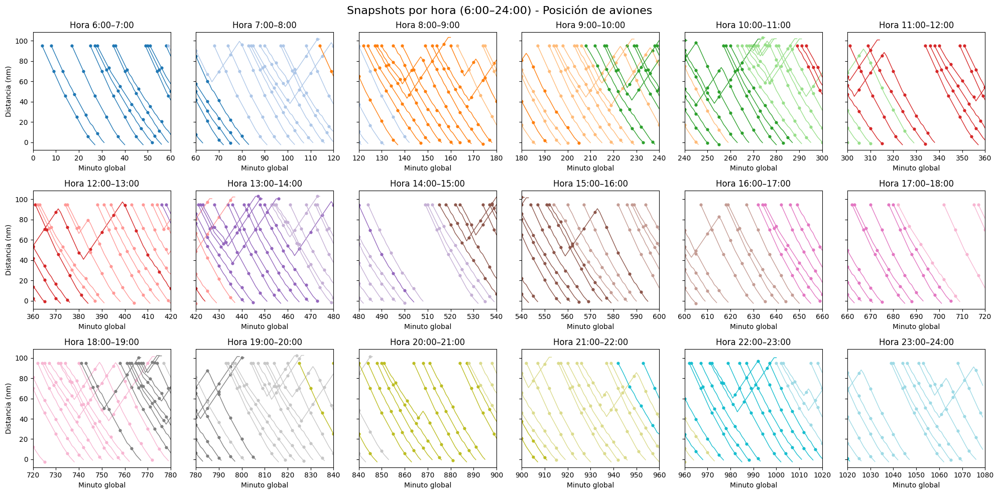

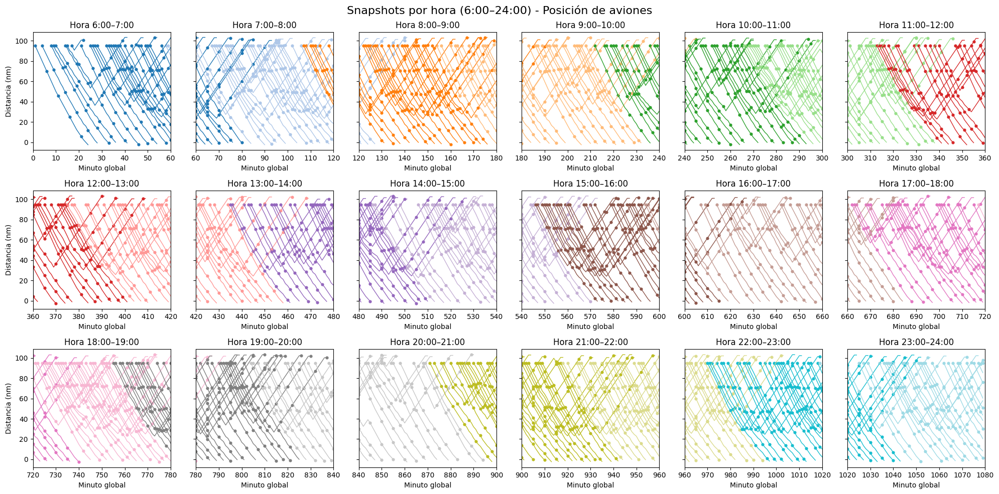

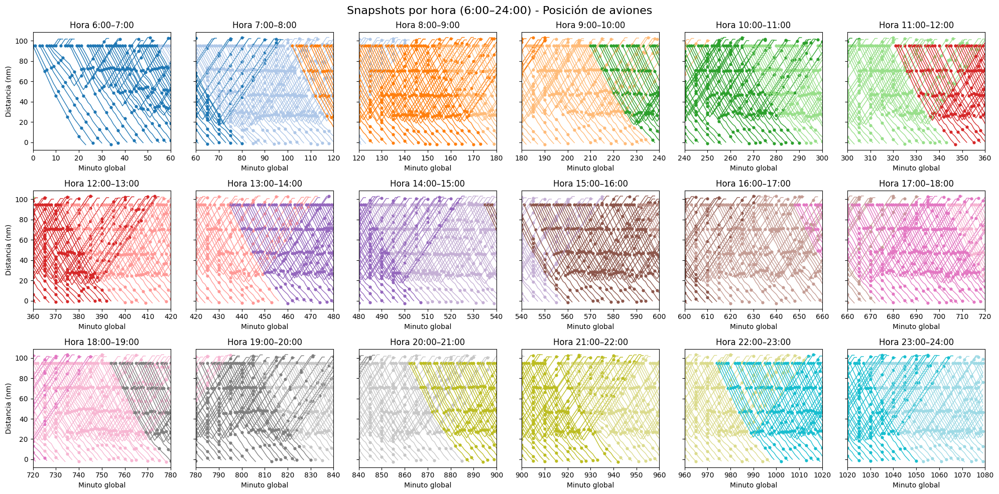

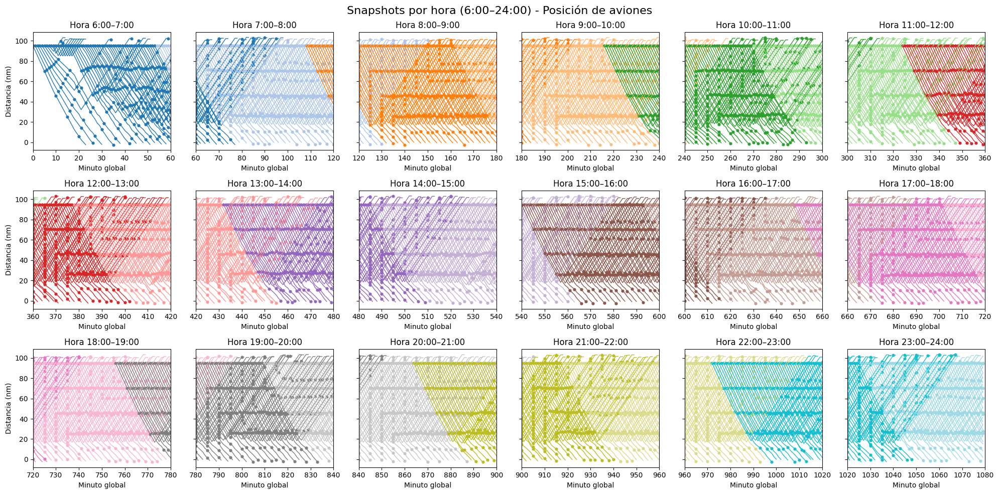

In [ ]:
## POPUESTA 2: REDUCIR LIMITES DE VELOCIDAD MÍNIMA A LA MITAD 
import numpy as np
from typing import List
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from main import Simulador, RADAR_DIST, MIN_SEPARACION

# ======================
# Parámetros globales
# ======================
RADAR_DIST = 100
MIN_SEPARACION = 4
VEL_RETROCESO = 200.0

# ======================
# Funciones auxiliares
# ======================
def vel_maxima_permitida_por_tramo(dist_nm: float) -> int:
    """Velocidad máxima permitida según distancia a AEP."""
    if dist_nm > 50:
        return 300
    elif dist_nm > 15:
        return 250
    elif dist_nm > 5:
        return 200
    else:
        return 150


def velocidad_minima_permitida_por_tramo(distancia): #Modificada
    """Velocidad mínima permitida según distancia a AEP."""
    if distancia > 50:
        return 125
    elif distancia > 15:
        return 100
    elif distancia > 5:
        return 75
    else:
        return 60



def tiempo_entre_aviones(avion_trasero, avion_delantero):
    """Devuelve la separación temporal (min) entre dos aviones."""
    delta_dist = avion_trasero.distancia - avion_delantero.distancia
    if avion_trasero.velocidad <= 0:
        return float("inf")
    return (delta_dist / avion_trasero.velocidad) * 60


def aterrizaje_libre(dist_inicial, minutos) -> float:
    """Distancia que se cubriría a velocidad máxima en un lapso dado."""
    v_max = vel_maxima_permitida_por_tramo(dist_inicial)
    return (v_max / 60.0) * minutos


def hay_gap_disponible(avion, cola) -> bool:
    """Verifica si el avión puede volver con al menos 10 minutos de separación."""
    pos = avion.distancia
    avance_estimado = aterrizaje_libre(pos, minutos=5)

    for otro in cola:
        if otro.estado in ("APROXIMANDO", "AJUSTANDO"):
            if pos - avance_estimado <= otro.distancia <= pos + avance_estimado:
                return False
    return True


# ======================
# Clase Avión . 
# ======================
class Avion:
    def __init__(self, id_avion, minuto_actual):
        self.id = id_avion
        self.distancia = 100.0
        self.velocidad = 0.0
        self.estado = "APROXIMANDO"
        # Estados posibles: APROXIMANDO | AJUSTANDO | REGRESANDO | REGRESANDO_VIENTO | DESVIADO | ATERRIZADO
        self.tiempo_llegada = minuto_actual
        self.retraso = 0
        self.t_aterrizaje = None

    def __repr__(self):
        return (f" Avión {self.id}\n"
                f" - Distancia: {self.distancia:.1f} mn\n"
                f" - Velocidad: {self.velocidad:.0f} kts\n"
                f" - Estado: {self.estado}")

    def controlar_aproximacion(self, lider=None):
        if lider is None:
            self.estado = "APROXIMANDO"
            self.velocidad = vel_maxima_permitida_por_tramo(self.distancia)
            return

        separacion = tiempo_entre_aviones(self, lider)
        if separacion < MIN_SEPARACION:
            nueva_vel = lider.velocidad - 20
            if nueva_vel < velocidad_minima_permitida_por_tramo(self.distancia):
                self.estado = "REGRESANDO" #solo van a regresar si llegan a un punto en el que disminuyen tanto la velocidad que llegan a 0 (o menos)
                self.velocidad = VEL_RETROCESO
    
            else:
                self.estado = "AJUSTANDO" 
                self.velocidad = nueva_vel
        else:
            self.estado = "APROXIMANDO"
            self.velocidad = vel_maxima_permitida_por_tramo(self.distancia)


# ======================
# Clase Simulador
# ======================
class Simulador:
    def __init__(self, seed=42):
        self.rng = np.random.default_rng(seed)
        self.aviones: dict[int, Avion] = {}
        self.historial = []
        self.finalizados: List[Avion] = []

    def generar_nuevo_avion(self, minuto: int, next_id: int, lam: float) -> int:
        if self.rng.random() < lam:
            avion = Avion(next_id, minuto)
            self.aviones[next_id] = avion
            return next_id + 1
        return next_id

    def actualizar_estados(self, minuto: int):
        activos = [a for a in self.aviones.values() if a.estado not in ("ATERRIZADO", "DESVIADO")]
        activos.sort(key=lambda av: av.distancia)

        for i, avion in enumerate(activos):
            if avion.estado == "REGRESANDO":
                self.controlar_regreso(avion, activos)
            else:
                lider = activos[i-1] if i > 0 and activos[i-1].estado != "REGRESANDO" else None
                avion.controlar_aproximacion(lider)

    def controlar_regreso(self, avion, cola):
        if avion.distancia > RADAR_DIST:
            avion.estado = "DESVIADO"
        elif hay_gap_disponible(avion, cola):
            avion.estado = "APROXIMANDO"

    def mover_aviones(self):
        for avion in self.aviones.values():
            if avion.estado in ("ATERRIZADO", "DESVIADO"):
                continue
            delta = avion.velocidad / 60.0
            if avion.estado == "REGRESANDO":
                avion.distancia += delta
            else:
                avion.distancia -= delta

    def gestionar_finalizados(self, minuto: int, tiempo_ideal=23.4):
        for avion in self.aviones.values():
            if avion.estado in ("ATERRIZADO", "DESVIADO"):
                continue
            if avion.distancia <= 0:
                avion.estado = "ATERRIZADO"
                avion.t_aterrizaje = minuto
                tiempo_real = minuto - avion.tiempo_llegada
                avion.retraso = max(0, tiempo_real - tiempo_ideal)
                self.finalizados.append(avion)

    def guardar_estado(self, minuto: int):
        for avion in self.aviones.values():
            self.historial.append({
                "minuto": minuto,
                "id": avion.id,
                "distancia": avion.distancia,
                "velocidad": avion.velocidad,
                "estado": avion.estado,
            })

    def simular_dia(self, lam: float, minutos=18*60):
        next_id = 1
        for minuto in range(minutos):
            next_id = self.generar_nuevo_avion(minuto, next_id, lam)
            self.actualizar_estados(minuto)
            self.mover_aviones()
            self.gestionar_finalizados(minuto)
            self.guardar_estado(minuto)



# ej7.py (igual al ej1 para poder comparar)
# =========================
# Simulación de un día
# =========================
def correr_un_dia(lam=1/60, seed=42):
    sim = Simulador(seed=seed)
    sim.simular_dia(lam)
    return sim


# =========================
# Monte Carlo de arribos
# =========================
from scipy.stats import binom

def monte_carlo_arribos_binomial(lam=1/60, horas=18, repeticiones=1000):
    rng = np.random.default_rng(42)
    minutos = horas * 60
    p = lam
    mu = minutos * p

    simulados = rng.binomial(minutos, p, size=repeticiones)

    plt.hist(simulados, bins=range(simulados.min(), simulados.max()+2),
             density=True, alpha=0.6, color="skyblue", edgecolor="black",
             label="Simulación")

    x = np.arange(simulados.min(), simulados.max()+1)
    plt.plot(x, binom.pmf(x, minutos, p), "g--", lw=2, label="Binomial exacta")

    plt.axvline(simulados.mean(), color="blue", linestyle="--",
                label=f"Media simulada = {simulados.mean():.2f}")
    plt.axvline(mu, color="red", linestyle=":",
                label=f"Media teórica = {mu:.2f}")

    plt.title("Distribución de arribos en 1000 simulaciones (λ=1/60)")
    plt.xlabel("Número de aviones en 18h")
    plt.ylabel("Frecuencia relativa")
    plt.legend()
    plt.show()


# =========================
# Snapshots por hora
# =========================
def graficar_snapshots(sim, lamda, duracion_horas=18):
    historial = sim.historial
    ids = set(reg["id"] for reg in historial)
    cmap = cm.get_cmap("tab20", len(ids))
    colores = {id_: cmap(i) for i, id_ in enumerate(ids)}

    fig, axes = plt.subplots(3, 6, figsize=(20, 10), sharey=True)
    axes = axes.flatten()

    for h in range(duracion_horas):
        minuto_ini = h * 60
        minuto_fin = (h + 1) * 60
        ax = axes[h]

        for id_ in ids:
            # historial completo del avión
            registros = [r for r in historial if r["id"] == id_]
            if not registros:
                continue

            # cortar el historial en el primer aterrizaje/desvío
            corte_idx = None
            for i, r in enumerate(registros):
                if r["estado"] in ("ATERRIZADO", "DESVIADO"):
                    corte_idx = i
                    break
            if corte_idx is not None:
                registros = registros[:corte_idx+1]

            # ahora filtro solo la hora correspondiente
            registros = [r for r in registros if minuto_ini <= r["minuto"] <= minuto_fin]
            if registros:
                ts = [r["minuto"] for r in registros]
                ds = [r["distancia"] for r in registros]
                color = colores[id_]
                ax.plot(ts, ds, color=color, linewidth=1)
                ax.scatter(ts[::5], ds[::5], c=[color], s=12)

        ax.invert_yaxis()
        ax.set_xlim(minuto_ini, minuto_fin)
        ax.set_title(f"Hora {6+h}:00–{7+h}:00")
        ax.set_xlabel("Minuto global")
        if h % 6 == 0:
            ax.set_ylabel("Distancia (nm)")

    plt.suptitle("Snapshots por hora (6:00–24:00) - Posición de aviones", fontsize=16)
    plt.tight_layout()
    #plt.show()

    # ======================
    # Summary de estados finales
    # ======================
    estados_finales = {"ATERRIZADO": 0, "DESVIADO": 0, "ACTIVO": 0}
    atraso = 0
    for avion in sim.aviones.values():
        if avion.estado == "ATERRIZADO":
            estados_finales["ATERRIZADO"] += 1
            atraso += avion.retraso
        elif avion.estado == "DESVIADO":
            estados_finales["DESVIADO"] += 1
        else:
            estados_finales["ACTIVO"] += 1

    
    atraso_promedio = atraso / estados_finales['ATERRIZADO']
        

    print(f"===== 📊 Resumen de la simulación con lam= {lamda} =====")
    print(f"✈️ Total de aviones: {len(sim.aviones)}")
    print(f"✅ Aterrizados: {estados_finales['ATERRIZADO']}")
    print(f"❌ Desviados: {estados_finales['DESVIADO']}")
    print(f"🕐 Activos al final: {estados_finales['ACTIVO']}")
    print(f"Suma de minutos de atraso de todos los aviones aterrizados en la simulacion: {atraso}")
    print(f" Atraso promedio: {atraso_promedio}")



# =========================
# Main
# =========================
if __name__ == "__main__":
    """
    lam = 0.2

    # 1. Simulación base
    sim = correr_un_dia(lam)
    print(f"Total aviones generados: {len(sim.aviones)}")
    aterrizados = [a for a in sim.aviones.values() if a.estado == "ATERRIZADO"]
    print(f"Aterrizados: {len(aterrizados)}")

    # 2. Monte Carlo
    monte_carlo_arribos_binomial(lam, repeticiones=1000)

    # 3. Graficar snapshots
    graficar_snapshots(sim)
    """

    lamdas = [0.017, 0.2, 0.5, 0.8, 1]
    for lamda in lamdas:
        sim = correr_un_dia(lamda)
        graficar_snapshots(sim, lamda) #descomentar plt.show() en graficar_snapshots para ver snapshots en el output. 
        




**Resultados propuesta 2: reducir el límite de velocidad mínima**

Como esperábamos, los desvíos a Montevideo se redujeron, pero no tanto como en la propuesta 1. Además, para casi todos los valores de λ, el tiempo de atraso promedio aumentó en relación a la simulación original, aunque menos que en la propuesta 1.

| λ              | Cambio en atraso prom. (vs. original) |              | Cambio en desvíos (vs. original) |              |
|----------------|---------------------------------------|--------------|----------------------------------|--------------|
|                | sin vmin                              | vmin reducida| sin vmin                         | vmin reducida|
| 1/60 = 0.017  | -69.6%                                | -69.6%       | 0%                               | 0%           |
| 0.02          | +10.1%                                | +37.1%       | -83.3%                           | -64.3%       |
| 0.5           | +872%                                 | +175.6%      | -55.1%                           | -36.1%       |
| 0.8           | +∞                                    | +∞           | -46.6%                           | -32.1%       |
| 1             | +∞                                    | +∞           | -40.3%                           | -29.8%       |

 [cuadro comparativo completo](https://docs.google.com/spreadsheets/d/1xJ9iZh-RHovqKXjzVQwHniUZ6GUaY2kzMOju7ekHTf8/edit?gid=0#gid=0)

Consideramos que esta propuesta es una versión más moderada y realista de la propuesta 1, ya que permitir que un avión vuele a 0 kts al acercarse a la pista no es factible por seguridad ni por el modo de funcionamiento de un avión. 

**Puntos débiles identificados:**
- Los límites de velocidad mínimos de un rango de distancia a la pista son más bajos que la velocidad máxima del rango de distancia contiguo pero más alejado de la pista. Como consecuencia, los aviones que vuelan detrás de alguno que esté reduciendo su velocidad para alejarse del que está adelante pueden alcanzarlo rápidamente y generar más congestión.